## Step 0: Importing and reading the dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

import matplotlib.pyplot as plt
import seaborn as sns

import os
import time 
import re

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the data
data = pd.read_excel('news_share_data.xlsx')
data

,article_id,title,text,published_date,unique_tokens_rate,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares
0,7014291,It's Time for a YouTube Competitor,It was reported last week that Yahoo is gettin...,2014-03-31,0.640816,5,3,1,4.579592,5,Business,1459.5000,4817.692,3370.415,1833.3330,0.403762,0.038762,0.036735,0.024490,0.250000,2.500000e-01,1600
1,7014327,The Ultimate Roundup of 2014's Biggest April F...,April Fools' marks the day when pranking goes ...,2014-04-01,0.549618,4,1,0,4.636704,7,Tech,0.0000,3581.094,2556.367,8500.0000,0.410707,0.180934,0.044944,0.003745,0.000000,0.000000e+00,1500
2,7014304,A Selfie and One Garish Jacket: How the Red So...,The 2013 World Series champion Boston Red Sox ...,2014-04-01,0.577236,8,1,0,4.627451,7,Tech,2270.8890,3852.800,3018.167,2076.3330,0.397545,0.044864,0.035294,0.019608,0.000000,0.000000e+00,1400
3,7031995,African Telecom Proposes More Diverse Emoticons,Less than a week after Apple pledged to make i...,2014-04-01,0.525896,4,1,0,5.083665,9,Tech,0.0000,3581.094,1871.403,2200.0000,0.491578,0.157620,0.047809,0.011952,0.000000,0.000000e+00,1300
4,6541359,"Google to Launch Improved Android Camera App, ...",Android users may soon see a series of new fea...,2014-04-01,0.588889,6,9,0,4.336022,7,00000,3581.0940,8453.451,5155.323,805.0000,0.628535,0.078497,0.053763,0.034946,0.000000,0.000000e+00,3000
5,7033985,Apple to Begin iPhone 6 Screen Production in M...,Whispers surrounding a possible iPhone 6 relea...,2014-04-01,0.494269,8,1,0,4.360679,4,Business,3343.7900,4817.692,3974.216,31625.0000,0.567866,0.098980,0.038190,0.024045,0.666667,-3.333300e-01,1600
6,7014312,"Apple Updates iWork for OS X, iOS and iCloud","Apple updated its iWork suite Tuesday, adding ...",2014-04-01,0.639706,4,1,0,4.594444,7,Lifestyle,2499.3330,5549.418,3667.217,4800.0000,0.347222,0.186111,0.033333,0.005556,0.000000,0.000000e+00,1300
7,3299703,Spare Your Facebook Friends From These 9 April...,Everybody's a comedian -- at least they think ...,2014-04-01,0.508511,26,8,0,4.713427,7,Tech,3030.8610,4622.544,3761.262,3700.0000,0.484539,0.134520,0.050100,0.026052,0.400000,-1.500000e-01,2000
8,7014271,Why Tech Takes April Fools' Day So Seriously,Tech journalists hate April Fools' Day. Not be...,2014-04-01,0.481013,9,3,1,4.374613,8,Lifestyle,0.0000,6813.466,3745.055,11800.0000,0.533060,0.186324,0.046440,0.021672,0.066667,3.333300e-02,2100
9,7008095,Atlanta Is World's Busiest Airport With 94 Mil...,Atlanta's Hartsfield-Jackson airport remained ...,2014-04-01,0.422028,11,1,0,4.272043,5,Business,3343.7900,5585.617,4111.006,2600.0000,0.502861,0.121931,0.043011,0.018280,0.357143,0.000000e+00,1100


In [3]:
df = data.copy()

## step 01: data understanding

In [4]:
df.shape

(1003, 22)

In [5]:
df.columns

Index(['article_id', 'title', 'text', 'published_date', 'unique_tokens_rate',
       'num_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel', 'min_avg_key', 'max_avg_key',
       'avg_avg_key', 'href_avg_shares', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'title_subjectivity',
       'title_sentiment_polarity', 'shares'],
      dtype='object')

In [6]:
df.dtypes

article_id                             int64
title                                 object
text                                  object
published_date                datetime64[ns]
unique_tokens_rate                   float64
num_hrefs                              int64
num_imgs                               int64
num_videos                             int64
average_token_length                 float64
num_keywords                           int64
data_channel                          object
min_avg_key                          float64
max_avg_key                          float64
avg_avg_key                          float64
href_avg_shares                      float64
global_subjectivity                  float64
global_sentiment_polarity            float64
global_rate_positive_words           float64
global_rate_negative_words           float64
title_subjectivity                   float64
title_sentiment_polarity             float64
shares                                 int64
dtype: obj

In [7]:
df.describe()

,article_id,unique_tokens_rate,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares
count,1.003000e+03,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000
mean,6.915159e+06,0.526890,11.720837,5.188435,1.215354,4.603757,7.206381,1131.437972,6463.258234,3359.478830,13518.302031,0.446724,0.106187,0.038169,0.017772,0.292537,0.057536,4247.304088
std,4.823885e+05,0.118793,15.181597,8.495002,4.079730,0.701756,1.856713,1181.134621,7455.421154,1467.674637,51499.106509,0.109167,0.092496,0.015673,0.010557,0.325227,0.266609,22609.634435
min,2.195051e+06,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,3568.870000,1360.101000,0.000000,0.000000,-0.300000,0.000000,0.000000,0.000000,-1.000000,58.000000
25%,7.006102e+06,0.466751,4.000000,1.000000,0.000000,4.490363,6.000000,0.000000,3613.040000,2533.297000,1300.000000,0.395575,0.051911,0.028655,0.011224,0.000000,0.000000,1000.000000
50%,7.013065e+06,0.533118,8.000000,2.000000,0.000000,4.685484,7.000000,984.066700,4635.807000,3004.755000,2766.667000,0.455990,0.102579,0.037325,0.016266,0.200000,0.000000,1600.000000
75%,7.027570e+06,0.596615,14.000000,7.000000,1.000000,4.855388,9.000000,2116.714500,6561.910000,3809.005000,7341.000000,0.509508,0.163183,0.046922,0.022597,0.500000,0.150000,3100.000000
max,7.041291e+06,0.867925,162.000000,84.000000,51.000000,7.218430,10.000000,3613.040000,102200.000000,17604.270000,663600.000000,0.875000,0.489623,0.120805,0.103030,1.000000,1.000000,663600.000000


In [8]:
df.duplicated().sum()

0

In [9]:
df.loc[df.duplicated()]

,article_id,title,text,published_date,unique_tokens_rate,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares


## step 02:data cleaning and data Preperation

In [10]:
# deleting irrelevant columns
df = df.drop(['article_id'],axis = 1)

In [11]:
df.columns

Index(['title', 'text', 'published_date', 'unique_tokens_rate', 'num_hrefs',
       'num_imgs', 'num_videos', 'average_token_length', 'num_keywords',
       'data_channel', 'min_avg_key', 'max_avg_key', 'avg_avg_key',
       'href_avg_shares', 'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'title_subjectivity', 'title_sentiment_polarity', 'shares'],
      dtype='object')

In [12]:
df.isnull().sum()

title                         0
text                          0
published_date                0
unique_tokens_rate            0
num_hrefs                     0
num_imgs                      0
num_videos                    0
average_token_length          0
num_keywords                  0
data_channel                  0
min_avg_key                   0
max_avg_key                   0
avg_avg_key                   0
href_avg_shares               0
global_subjectivity           0
global_sentiment_polarity     0
global_rate_positive_words    0
global_rate_negative_words    0
title_subjectivity            0
title_sentiment_polarity      0
shares                        0
dtype: int64

In [13]:
df['data_channel'].value_counts()

00000            350
Tech             198
Entertainment    185
Business         164
Social Media      55
Lifestyle         51
Name: data_channel, dtype: int64

In [14]:
df['data_channel'] = df['data_channel'].apply(lambda x : x.replace('00000','unknown'))
#str.replace('a', 'be')

In [15]:
df['published_date'] = pd.to_datetime(df['published_date'])
df['day'] = df['published_date'].dt.day
df['month'] = df['published_date'].dt.month
df['year'] = df['published_date'].dt.year

In [16]:
df = df.drop('published_date',axis = 1)

In [17]:
df

,title,text,unique_tokens_rate,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares,day,month,year
0,It's Time for a YouTube Competitor,It was reported last week that Yahoo is gettin...,0.640816,5,3,1,4.579592,5,Business,1459.5000,4817.692,3370.415,1833.3330,0.403762,0.038762,0.036735,0.024490,0.250000,2.500000e-01,1600,31,3,2014
1,The Ultimate Roundup of 2014's Biggest April F...,April Fools' marks the day when pranking goes ...,0.549618,4,1,0,4.636704,7,Tech,0.0000,3581.094,2556.367,8500.0000,0.410707,0.180934,0.044944,0.003745,0.000000,0.000000e+00,1500,1,4,2014
2,A Selfie and One Garish Jacket: How the Red So...,The 2013 World Series champion Boston Red Sox ...,0.577236,8,1,0,4.627451,7,Tech,2270.8890,3852.800,3018.167,2076.3330,0.397545,0.044864,0.035294,0.019608,0.000000,0.000000e+00,1400,1,4,2014
3,African Telecom Proposes More Diverse Emoticons,Less than a week after Apple pledged to make i...,0.525896,4,1,0,5.083665,9,Tech,0.0000,3581.094,1871.403,2200.0000,0.491578,0.157620,0.047809,0.011952,0.000000,0.000000e+00,1300,1,4,2014
4,"Google to Launch Improved Android Camera App, ...",Android users may soon see a series of new fea...,0.588889,6,9,0,4.336022,7,unknown,3581.0940,8453.451,5155.323,805.0000,0.628535,0.078497,0.053763,0.034946,0.000000,0.000000e+00,3000,1,4,2014
5,Apple to Begin iPhone 6 Screen Production in M...,Whispers surrounding a possible iPhone 6 relea...,0.494269,8,1,0,4.360679,4,Business,3343.7900,4817.692,3974.216,31625.0000,0.567866,0.098980,0.038190,0.024045,0.666667,-3.333300e-01,1600,1,4,2014
6,"Apple Updates iWork for OS X, iOS and iCloud","Apple updated its iWork suite Tuesday, adding ...",0.639706,4,1,0,4.594444,7,Lifestyle,2499.3330,5549.418,3667.217,4800.0000,0.347222,0.186111,0.033333,0.005556,0.000000,0.000000e+00,1300,1,4,2014
7,Spare Your Facebook Friends From These 9 April...,Everybody's a comedian -- at least they think ...,0.508511,26,8,0,4.713427,7,Tech,3030.8610,4622.544,3761.262,3700.0000,0.484539,0.134520,0.050100,0.026052,0.400000,-1.500000e-01,2000,1,4,2014
8,Why Tech Takes April Fools' Day So Seriously,Tech journalists hate April Fools' Day. Not be...,0.481013,9,3,1,4.374613,8,Lifestyle,0.0000,6813.466,3745.055,11800.0000,0.533060,0.186324,0.046440,0.021672,0.066667,3.333300e-02,2100,1,4,2014
9,Atlanta Is World's Busiest Airport With 94 Mil...,Atlanta's Hartsfield-Jackson airport remained ...,0.422028,11,1,0,4.272043,5,Business,3343.7900,5585.617,4111.006,2600.0000,0.502861,0.121931,0.043011,0.018280,0.357143,0.000000e+00,1100,1,4,2014


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1003 entries, 0 to 1002
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   title                       1003 non-null   object 
 1   text                        1003 non-null   object 
 2   unique_tokens_rate          1003 non-null   float64
 3   num_hrefs                   1003 non-null   int64  
 4   num_imgs                    1003 non-null   int64  
 5   num_videos                  1003 non-null   int64  
 6   average_token_length        1003 non-null   float64
 7   num_keywords                1003 non-null   int64  
 8   data_channel                1003 non-null   object 
 9   min_avg_key                 1003 non-null   float64
 10  max_avg_key                 1003 non-null   float64
 11  avg_avg_key                 1003 non-null   float64
 12  href_avg_shares             1003 non-null   float64
 13  global_subjectivity         1003 

## Step 3: Univariate Analysis

<AxesSubplot:xlabel='unique_tokens_rate', ylabel='Density'>

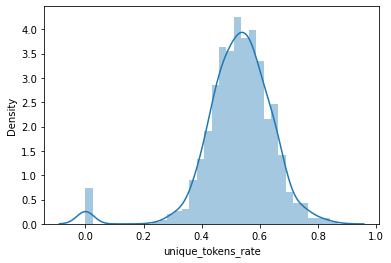

In [19]:
#histogram
sns.distplot(df['unique_tokens_rate'])

In [20]:
#skewness and kurtosis
print("Skewdness: %f" % df['unique_tokens_rate'].skew())
print("kurtosis: %f" % df["unique_tokens_rate"].kurt())


Skewdness: -1.442108
kurtosis: 5.648770



 * kurtosis> 3 : so it has huge outlier
 * skewness : so it has positive skewness
 * it means that the majority of the data points are concentrated to the right of the mean, and there are some smaller values that extend further to the left.

#### standard scaling

In [21]:
x = df.drop('unique_tokens_rate',axis = 1)
y = df['unique_tokens_rate'][0:1003,np.newaxis] # adding new column. Here are two columns: unique_tokens_rate,empty another column

In [22]:
print(y.mean())
print(y.std())
print(y.shape)

0.5268903828514456
0.1187342352017066
(1003, 1)


In [23]:
 # standardizing data
scaler = StandardScaler() #
xc = scaler.fit_transform(y) # converted means into 0 and sd into 1


In [24]:
print(xc.mean()) # means is tends to zero
print(xc.std()) # standard_deviation is tends to 1
print(xc.shape)

3.1878786748957638e-16
0.9999999999999999
(1003, 1)


In [25]:
x["unique_tokens_rate"] = xc


In [26]:
x

,title,text,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares,day,month,year,unique_tokens_rate
0,It's Time for a YouTube Competitor,It was reported last week that Yahoo is gettin...,5,3,1,4.579592,5,Business,1459.5000,4817.692,3370.415,1833.3330,0.403762,0.038762,0.036735,0.024490,0.250000,2.500000e-01,1600,31,3,2014,0.959501
1,The Ultimate Roundup of 2014's Biggest April F...,April Fools' marks the day when pranking goes ...,4,1,0,4.636704,7,Tech,0.0000,3581.094,2556.367,8500.0000,0.410707,0.180934,0.044944,0.003745,0.000000,0.000000e+00,1500,1,4,2014,0.191416
2,A Selfie and One Garish Jacket: How the Red So...,The 2013 World Series champion Boston Red Sox ...,8,1,0,4.627451,7,Tech,2270.8890,3852.800,3018.167,2076.3330,0.397545,0.044864,0.035294,0.019608,0.000000,0.000000e+00,1400,1,4,2014,0.424019
3,African Telecom Proposes More Diverse Emoticons,Less than a week after Apple pledged to make i...,4,1,0,5.083665,9,Tech,0.0000,3581.094,1871.403,2200.0000,0.491578,0.157620,0.047809,0.011952,0.000000,0.000000e+00,1300,1,4,2014,-0.008375
4,"Google to Launch Improved Android Camera App, ...",Android users may soon see a series of new fea...,6,9,0,4.336022,7,unknown,3581.0940,8453.451,5155.323,805.0000,0.628535,0.078497,0.053763,0.034946,0.000000,0.000000e+00,3000,1,4,2014,0.522163
5,Apple to Begin iPhone 6 Screen Production in M...,Whispers surrounding a possible iPhone 6 relea...,8,1,0,4.360679,4,Business,3343.7900,4817.692,3974.216,31625.0000,0.567866,0.098980,0.038190,0.024045,0.666667,-3.333300e-01,1600,1,4,2014,-0.274743
6,"Apple Updates iWork for OS X, iOS and iCloud","Apple updated its iWork suite Tuesday, adding ...",4,1,0,4.594444,7,Lifestyle,2499.3330,5549.418,3667.217,4800.0000,0.347222,0.186111,0.033333,0.005556,0.000000,0.000000e+00,1300,1,4,2014,0.950152
7,Spare Your Facebook Friends From These 9 April...,Everybody's a comedian -- at least they think ...,26,8,0,4.713427,7,Tech,3030.8610,4622.544,3761.262,3700.0000,0.484539,0.134520,0.050100,0.026052,0.400000,-1.500000e-01,2000,1,4,2014,-0.154794
8,Why Tech Takes April Fools' Day So Seriously,Tech journalists hate April Fools' Day. Not be...,9,3,1,4.374613,8,Lifestyle,0.0000,6813.466,3745.055,11800.0000,0.533060,0.186324,0.046440,0.021672,0.066667,3.333300e-02,2100,1,4,2014,-0.386387
9,Atlanta Is World's Busiest Airport With 94 Mil...,Atlanta's Hartsfield-Jackson airport remained ...,11,1,0,4.272043,5,Business,3343.7900,5585.617,4111.006,2600.0000,0.502861,0.121931,0.043011,0.018280,0.357143,0.000000e+00,1100,1,4,2014,-0.883169


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1003 entries, 0 to 1002
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   title                       1003 non-null   object 
 1   text                        1003 non-null   object 
 2   unique_tokens_rate          1003 non-null   float64
 3   num_hrefs                   1003 non-null   int64  
 4   num_imgs                    1003 non-null   int64  
 5   num_videos                  1003 non-null   int64  
 6   average_token_length        1003 non-null   float64
 7   num_keywords                1003 non-null   int64  
 8   data_channel                1003 non-null   object 
 9   min_avg_key                 1003 non-null   float64
 10  max_avg_key                 1003 non-null   float64
 11  avg_avg_key                 1003 non-null   float64
 12  href_avg_shares             1003 non-null   float64
 13  global_subjectivity         1003 

In [28]:
df.columns

Index(['title', 'text', 'unique_tokens_rate', 'num_hrefs', 'num_imgs',
       'num_videos', 'average_token_length', 'num_keywords', 'data_channel',
       'min_avg_key', 'max_avg_key', 'avg_avg_key', 'href_avg_shares',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'title_subjectivity', 'title_sentiment_polarity', 'shares', 'day',
       'month', 'year'],
      dtype='object')

In [29]:
cols = ['unique_tokens_rate','num_hrefs','num_imgs',
       'num_videos', 'average_token_length', 'num_keywords', 
       'min_avg_key', 'max_avg_key', 'avg_avg_key', 'href_avg_shares',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'title_subjectivity', 'title_sentiment_polarity', 'shares' ]

In [30]:
#skewness and kurtosis

for i in cols:
    print(i)
    print("Skewdness: %f" % df[f"{i}"].skew())
    print("kurtosis: %f" % df[f"{i}"].kurt())


unique_tokens_rate
Skewdness: -1.442108
kurtosis: 5.648770
num_hrefs
Skewdness: 5.677885
kurtosis: 44.628413
num_imgs
Skewdness: 3.786863
kurtosis: 21.483964
num_videos
Skewdness: 6.862536
kurtosis: 60.092097
average_token_length
Skewdness: -5.231828
kurtosis: 32.664324
num_keywords
Skewdness: -0.072570
kurtosis: -0.817605
min_avg_key
Skewdness: 0.496109
kurtosis: -1.146158
max_avg_key
Skewdness: 7.549974
kurtosis: 73.227495
avg_avg_key
Skewdness: 3.384445
kurtosis: 20.688642
href_avg_shares
Skewdness: 7.976412
kurtosis: 75.151554
global_subjectivity
Skewdness: -1.084707
kurtosis: 4.401509
global_sentiment_polarity
Skewdness: -0.105823
kurtosis: 1.403137
global_rate_positive_words
Skewdness: 0.399711
kurtosis: 1.298705
global_rate_negative_words
Skewdness: 1.487901
kurtosis: 6.117718
title_subjectivity
Skewdness: 0.776942
kurtosis: -0.582063
title_sentiment_polarity
Skewdness: 0.078943
kurtosis: 3.007349
shares
Skewdness: 25.408722
kurtosis: 726.442012


In [31]:
edit_col = [
    'unique_tokens_rate','num_hrefs','num_imgs','num_videos','average_token_length','num_keywords','min_avg_key','max_avg_key',
    'avg_avg_key','href_avg_shares','global_subjectivity','global_sentiment_polarity','global_rate_positive_words',
    'global_rate_negative_words','title_subjectivity','shares'
       ]

* Skewness=0: Perfectly symmetrical distribution.

* Skewness<0: Negatively skewed distribution.

* Skewness>0: Positively skewed distribution

* Kurtosis=3: Baseline reference for a normal distribution (mesokurtic).

* Kurtosis<3: Platykurtic (lighter tails and flatter peak).

* Kurtosis>3: Leptokurtic (heavier tails and sharper peak).

In [32]:
for i in edit_col:
    x = df.drop(f"{i}",axis = 1)
    y = df[f"{i}"][0:1003,np.newaxis] # adding new column. Here are two columns: unique_tokens_rate,empty another column
    scaler = StandardScaler() 
    xcc = scaler.fit_transform(y) # converted means into 0 and sd into 1
    x[f"{i} _scaled"] = xcc.flatten() 
    

In [33]:

modified_df = df.copy()

for col in edit_col:
    x = modified_df.drop(col, axis=1)
    y = modified_df[col][0:1003,np.newaxis]#  # adding new column.
    scaler = StandardScaler()
    xcc = scaler.fit_transform(y)
    modified_df[f"{col}_scaled"] = xcc.flatten()
    modified_df = modified_df.drop(col, axis=1)




In [34]:
df.head(2)

,title,text,unique_tokens_rate,num_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel,min_avg_key,max_avg_key,avg_avg_key,href_avg_shares,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,title_subjectivity,title_sentiment_polarity,shares,day,month,year
0,It's Time for a YouTube Competitor,It was reported last week that Yahoo is gettin...,0.640816,5,3,1,4.579592,5,Business,1459.5,4817.692,3370.415,1833.333,0.403762,0.038762,0.036735,0.024490,0.25,0.25,1600,31,3,2014
1,The Ultimate Roundup of 2014's Biggest April F...,April Fools' marks the day when pranking goes ...,0.549618,4,1,0,4.636704,7,Tech,0.0,3581.094,2556.367,8500.000,0.410707,0.180934,0.044944,0.003745,0.00,0.00,1500,1,4,2014


In [35]:
modified_df.head(2)

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
0,It's Time for a YouTube Competitor,It was reported last week that Yahoo is gettin...,Business,0.25,31,3,2014,0.959501,-0.442917,-0.257743,-0.052813,-0.034452,-1.188919,0.277890,-0.220831,0.007455,-0.227010,-0.393741,-0.729313,-0.091514,0.636659,-0.130856,-0.117146
1,The Ultimate Roundup of 2014's Biggest April F...,April Fools' marks the day when pranking goes ...,Tech,0.00,1,4,2014,0.191416,-0.508819,-0.493293,-0.298049,0.046973,-0.111209,-0.958403,-0.386779,-0.547473,-0.097493,-0.330091,0.808507,0.432522,-1.329370,-0.899934,-0.121571


In [36]:
modified_df.shape

(1003, 23)

In [37]:
df.shape

(1003, 23)

In [38]:
modified_df.columns

Index(['title', 'text', 'data_channel', 'title_sentiment_polarity', 'day',
       'month', 'year', 'unique_tokens_rate_scaled', 'num_hrefs_scaled',
       'num_imgs_scaled', 'num_videos_scaled', 'average_token_length_scaled',
       'num_keywords_scaled', 'min_avg_key_scaled', 'max_avg_key_scaled',
       'avg_avg_key_scaled', 'href_avg_shares_scaled',
       'global_subjectivity_scaled', 'global_sentiment_polarity_scaled',
       'global_rate_positive_words_scaled',
       'global_rate_negative_words_scaled', 'title_subjectivity_scaled',
       'shares_scaled'],
      dtype='object')

In [39]:
cols = {'data_channel', 'title_sentiment_polarity', 'day',
       'month', 'year', 'unique_tokens_rate_scaled', 'num_hrefs_scaled',
       'num_imgs_scaled', 'num_videos_scaled', 'average_token_length_scaled',
       'num_keywords_scaled', 'min_avg_key_scaled', 'max_avg_key_scaled',
       'avg_avg_key_scaled', 'href_avg_shares_scaled',
       'global_subjectivity_scaled', 'global_sentiment_polarity_scaled',
       'global_rate_positive_words_scaled',
       'global_rate_negative_words_scaled', 'title_subjectivity_scaled',
       'shares_scaled'}

num_videos_scaled value count: 

AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 0, 'num_videos_scaled')
Text(0, 0.5, 'Count')




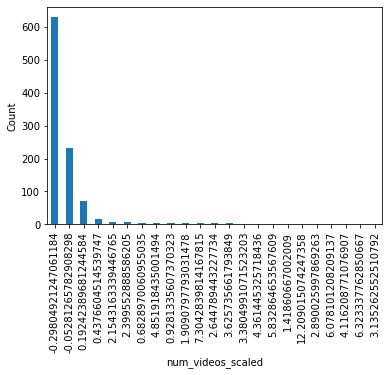

month value count: 

AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 0, 'month')
Text(0, 0.5, 'Count')




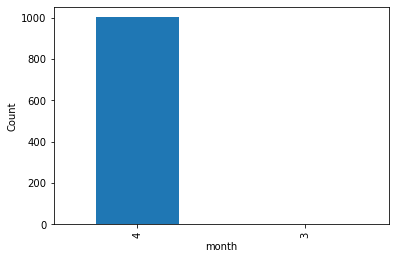

data_channel value count: 

AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 0, 'data_channel')
Text(0, 0.5, 'Count')




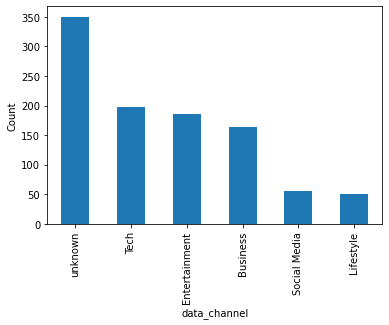

num_keywords_scaled value count: 

AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 0, 'num_keywords_scaled')
Text(0, 0.5, 'Count')




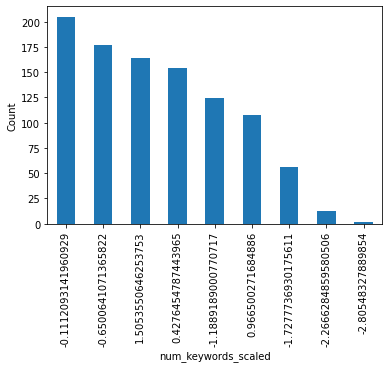

year value count: 

AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 0, 'year')
Text(0, 0.5, 'Count')




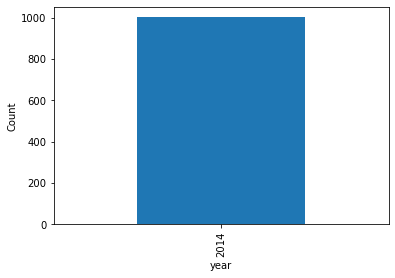

In [40]:
for col in cols:
    if modified_df[col].value_counts().iloc[0:10].sum()>850:
        print(f"{col} value count: \n")
        print(modified_df[col].value_counts().plot.bar())
        print(plt.xlabel(col))
        print(plt.ylabel('Count'))
        print("\n")
        plt.show()

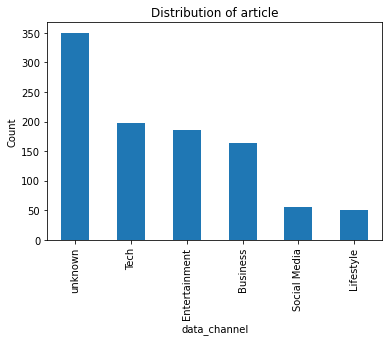

In [41]:
df['data_channel'].value_counts().plot.bar()
plt.xlabel('data_channel')
plt.ylabel('Count')
plt.title("Distribution of article")
plt.show()

### Bivariant analysis

In [42]:
modified_df.columns

Index(['title', 'text', 'data_channel', 'title_sentiment_polarity', 'day',
       'month', 'year', 'unique_tokens_rate_scaled', 'num_hrefs_scaled',
       'num_imgs_scaled', 'num_videos_scaled', 'average_token_length_scaled',
       'num_keywords_scaled', 'min_avg_key_scaled', 'max_avg_key_scaled',
       'avg_avg_key_scaled', 'href_avg_shares_scaled',
       'global_subjectivity_scaled', 'global_sentiment_polarity_scaled',
       'global_rate_positive_words_scaled',
       'global_rate_negative_words_scaled', 'title_subjectivity_scaled',
       'shares_scaled'],
      dtype='object')

In [43]:
#modified_df['num_videos_scaled'].value_counts()[0:5].sum()

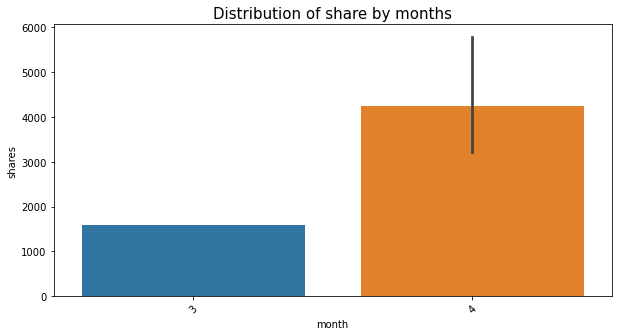

In [44]:
plt.figure(figsize=(10,5))
sns.barplot(x=df['month'],y=df['shares'])
plt.title("Distribution of share by months",size=15)
plt.xticks(rotation=45)
plt.show()

4th month has highest sharing of article

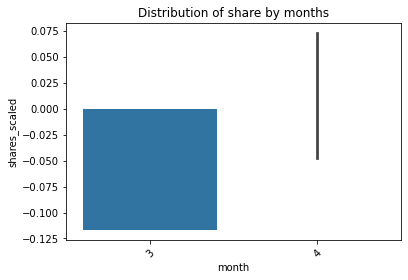

In [45]:
#plt.figure(figsize=(10,5))
sns.barplot(x=modified_df['month'],y=modified_df['shares_scaled'])
plt.title("Distribution of share by months")
plt.xticks(rotation=45)
plt.show()

4th month has highest sharing of article as month 3 has neg share

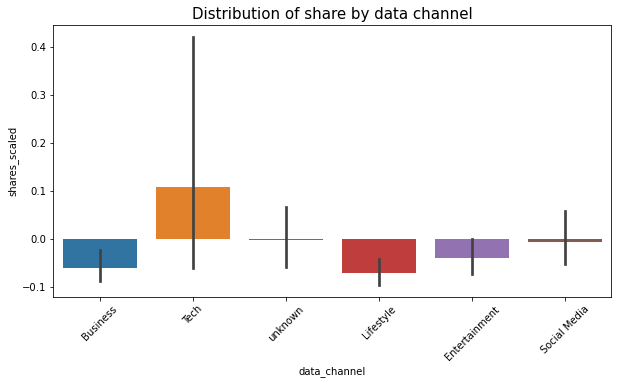

In [46]:
plt.figure(figsize=(10,5))
sns.barplot(x=modified_df['data_channel'],y=modified_df['shares_scaled'])
plt.title("Distribution of share by data channel",size=15)
plt.xticks(rotation=45)
plt.show()

tech article positve sharing or heigh sharing 

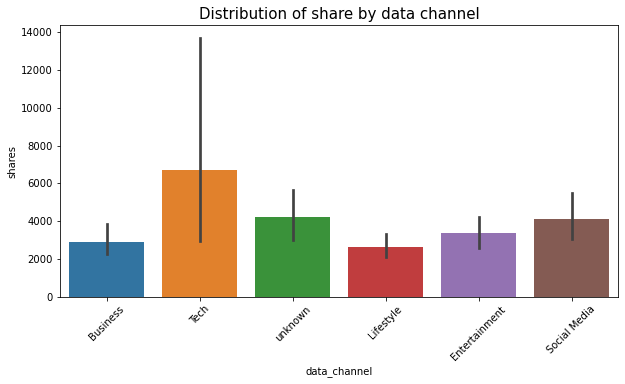

In [47]:
plt.figure(figsize=(10,5))
sns.barplot(x=df['data_channel'],y=df['shares'])
plt.title("Distribution of share by data channel",size=15)
plt.xticks(rotation=45)
plt.show()

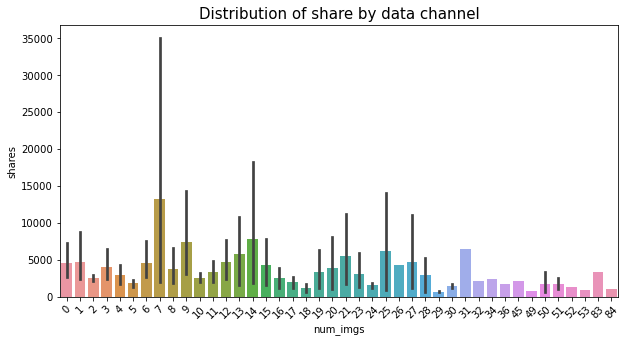

In [48]:
plt.figure(figsize=(10,5))
sns.barplot(x=df['num_imgs'],y=df['shares'])
plt.title("Distribution of share by data channel",size=15)
plt.xticks(rotation=45)
plt.show()

If a article has 7 num of img , it has highest probability to be most sharing article.

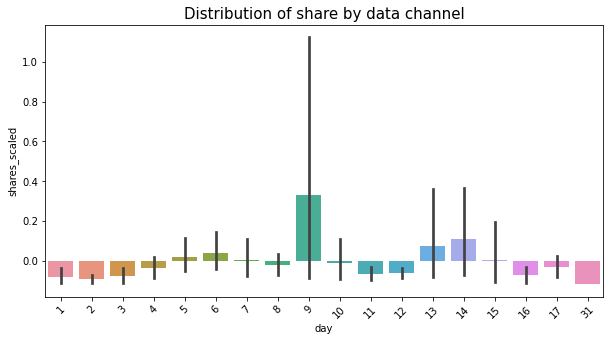

In [49]:
plt.figure(figsize=(10,5))
sns.barplot(x=modified_df['day'],y=modified_df['shares_scaled'])
plt.title("Distribution of share by data channel",size=15)
plt.xticks(rotation=45)
plt.show()

day 9 has most share

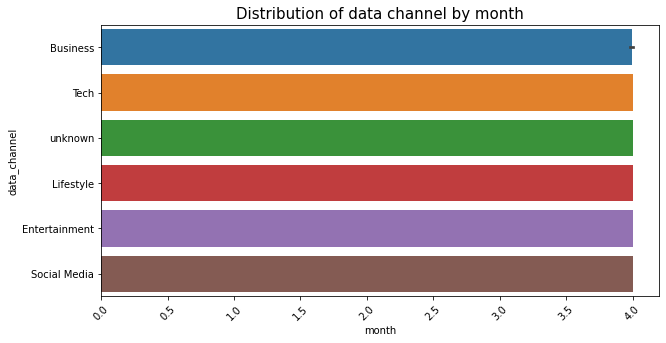

In [50]:
plt.figure(figsize=(10,5))
sns.barplot(x=modified_df['month'],y=modified_df['data_channel'])
plt.title("Distribution of data channel by month",size=15)
plt.xticks(rotation=45)
plt.show()

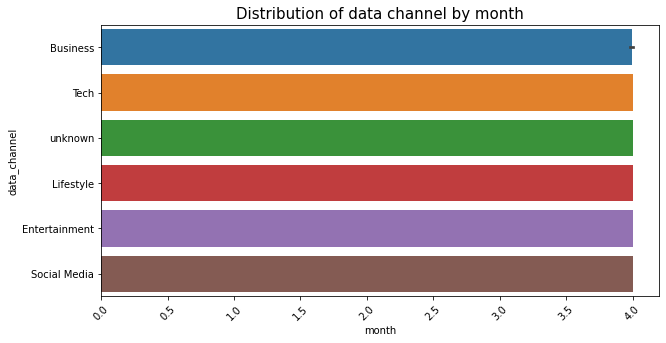

In [51]:
plt.figure(figsize=(10,5))
sns.barplot(x=df['month'],y=df['data_channel'])
plt.title("Distribution of data channel by month",size=15)
plt.xticks(rotation=45)
plt.show()

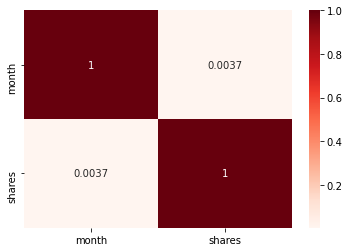

In [52]:
x = df[['month','shares']].corr()
sns.heatmap(x,annot = True,cmap = 'Reds')
plt.show()

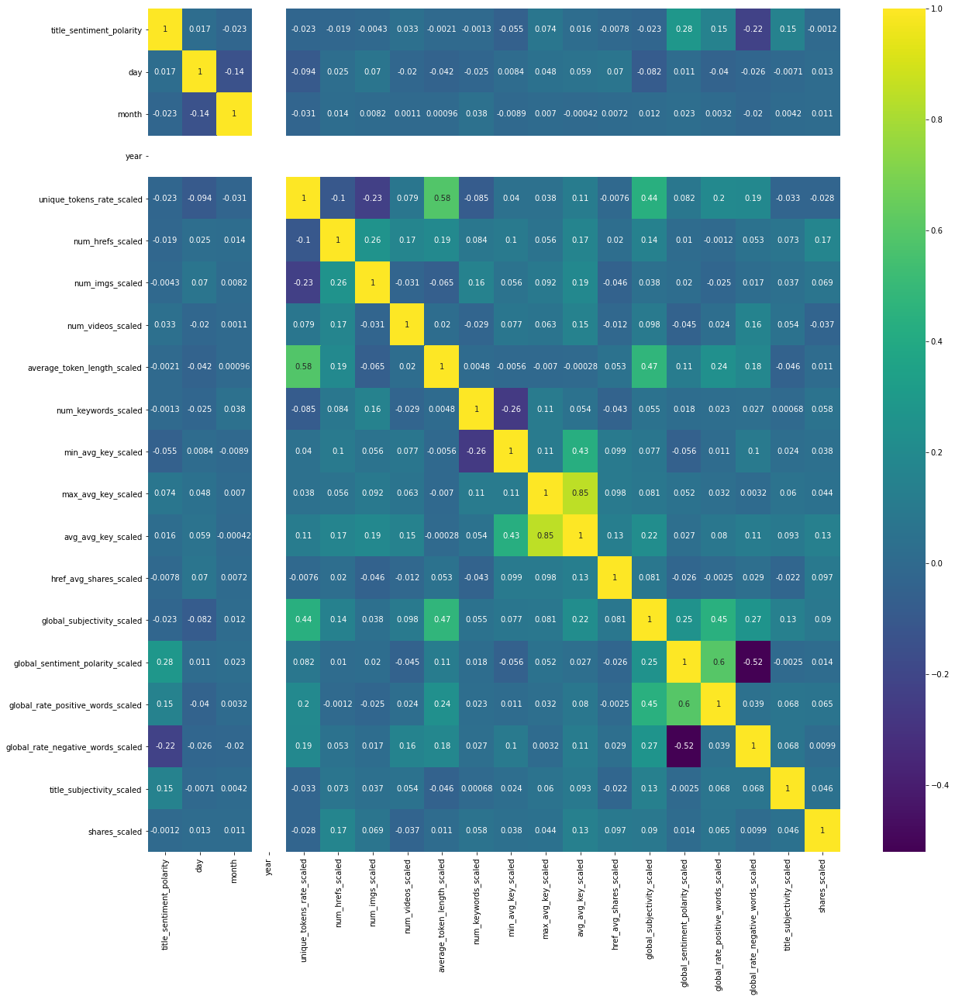

### 2. Numeric - Categorical Analysis

In [54]:
#grouby the response to find the mean of the salary with response no and yes separately
df.groupby('data_channel')['shares'].mean()


data_channel
Business         2912.268293
Entertainment    3389.443243
Lifestyle        2650.274510
Social Media     4137.018182
Tech             6682.075758
unknown          4198.960000
Name: shares, dtype: float64

In [55]:
#groupby the response to find the median of the salary with response no ans yes separately
df.groupby('data_channel')['shares'].median()


data_channel
Business         1600
Entertainment    1300
Lifestyle        1900
Social Media     2600
Tech             2100
unknown          1400
Name: shares, dtype: int64

<AxesSubplot:xlabel='data_channel', ylabel='shares'>

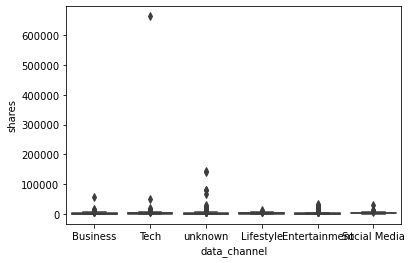

In [56]:
#plot the box plot of the salary for yes and no response
sns.boxplot(df.data_channel,df.shares)

<AxesSubplot:xlabel='data_channel', ylabel='shares_scaled'>

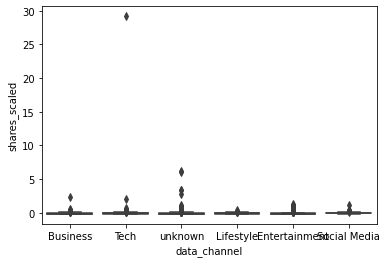

In [57]:
#plot the box plot of the salary for yes and no response
sns.boxplot(modified_df.data_channel,modified_df.shares_scaled)

In [61]:
#plot the box plot of the salary for yes and no response
sns.boxplot(df.data_channel,df.day)

SyntaxError: invalid syntax (<ipython-input-61-99e6d483b603>, line 2)

In [62]:
df.columns

Index(['title', 'text', 'unique_tokens_rate', 'num_hrefs', 'num_imgs',
       'num_videos', 'average_token_length', 'num_keywords', 'data_channel',
       'min_avg_key', 'max_avg_key', 'avg_avg_key', 'href_avg_shares',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'title_subjectivity', 'title_sentiment_polarity', 'shares', 'day',
       'month', 'year'],
      dtype='object')

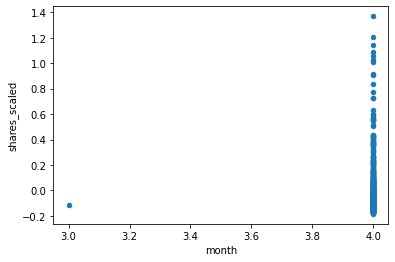

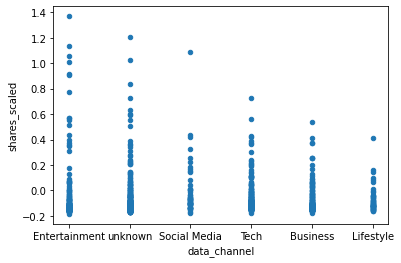

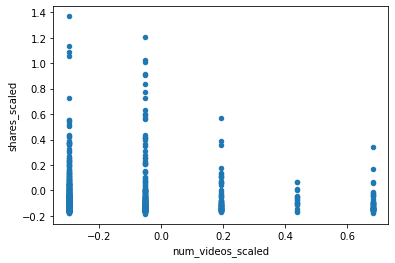

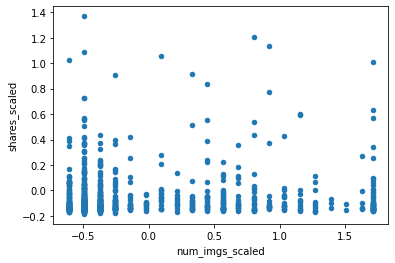

KeyError: 'unique_tokens_rate'

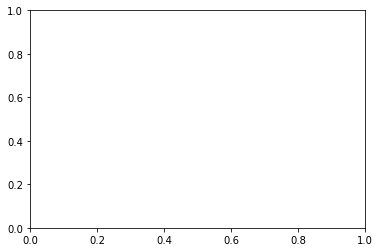

In [99]:
modified_df.plot.scatter('month','shares_scaled')
plt.show()

modified_df.plot.scatter('data_channel','shares_scaled')
plt.show()

modified_df.plot.scatter('num_videos_scaled','shares_scaled')
plt.show()

modified_df.plot.scatter('num_imgs_scaled','shares_scaled')
plt.show()


## outlier for num_img

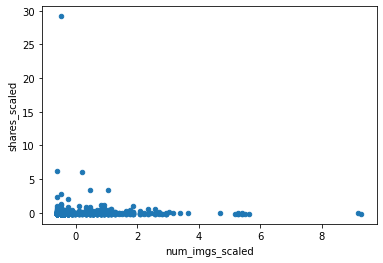

In [60]:
#modified_df.plot.scatter('num_imgs_scaled','shares_scaled')
#plt.show()
modified_df.plot.scatter('num_imgs_scaled','shares_scaled')
plt.show()

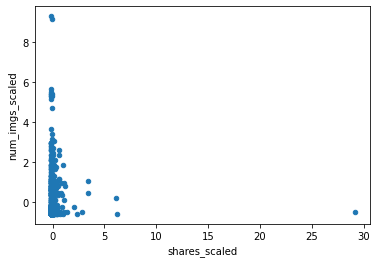

In [64]:
modified_df.plot.scatter('shares_scaled','num_imgs_scaled')
plt.show()

In [65]:
modified_df = modified_df.sort_values(by = 'shares_scaled', ascending = False)
modified_df


,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
516,'I'm Able to Make My Mark': 10 Employees Descr...,"This week, as part of The First 100, employees...",Tech,2.857140e-01,9,4,2014,-2.435543,1.006929,-0.493293,-0.052813,-0.021093,1.505355,0.262219,-0.336746,-0.340295,-0.051353,-0.288244,-0.329509,-0.638019,-0.001720,0.748089,29.177015
864,Case Study Shows How Twitter Advertising Can P...,Twitter is on a roll when it comes to advertis...,unknown,0.000000e+00,15,4,2014,2.019440,-0.706526,-0.611068,-0.052813,-0.003038,-0.650064,-0.958403,-0.060264,0.118830,0.666008,1.832454,-1.220734,-0.879577,-0.913798,-0.899934,6.250573
793,Study: 54% of Online Adults Would Spend Tax Re...,"If you're getting a tax refund this year, are ...",unknown,0.000000e+00,14,4,2014,-0.425483,-0.640623,0.213357,-0.298049,-0.421276,-0.650064,-0.958403,-0.383966,-0.795433,-0.068352,0.456100,-0.111868,0.203284,0.453372,-0.899934,6.069144
713,Beyonce Crashes Coachella With Surprise Dance ...,"Out of nowhere, Beyonce returned to Coachella ...",unknown,3.000000e-01,13,4,2014,-0.541540,8.981081,1.037782,-0.298049,0.658998,1.505355,-0.958403,0.110506,0.718525,0.144379,0.393687,-0.767377,-0.658128,1.164440,0.176775,3.440634
750,My Escape From Eastern Ukraine,"SLOVIANSK, Ukraine â€” As you drive into the o...",unknown,3.500000e-01,14,4,2014,0.647156,0.018397,0.448907,-0.052813,0.057362,-0.650064,-0.958403,0.595736,1.554526,-0.100407,0.229563,0.093864,0.313785,0.464744,1.253484,3.427359
578,"In Signing Climate Statement, Shell Charts Dif...",Faced with ominous scientific warnings on glob...,unknown,0.000000e+00,10,4,2014,0.605947,-0.640623,-0.493293,-0.298049,-0.127559,-0.650064,-0.958403,-0.342048,-0.742202,-0.248231,0.804430,0.102961,-0.612676,-1.142765,-0.899934,2.807845
383,Space Nerds Rejoice: NASA Tweets Even More 'Co...,On the latest episode of Cosmos: A Space-Time ...,Business,-2.916700e-01,7,4,2014,0.962297,-0.508819,-0.611068,0.192424,-0.209212,-0.111209,-0.958403,0.082282,-0.067679,-0.072237,-2.325688,-2.478598,-1.858832,1.317496,1.150941,2.343210
627,How Brands Are Using Twitter's Redesigned Prof...,"Visa's on, but MasterCard isn't. Microsoft has...",Tech,0.000000e+00,10,4,2014,0.131711,-0.442917,-0.257743,-0.052813,-0.423563,-1.188919,-0.958403,-0.267332,-0.355892,0.165750,0.840356,-1.018301,-0.166777,0.211136,-0.899934,2.055578
368,Watch HBO's 'Silicon Valley' Premiere on YouTu...,HBO just posted the first 30-minute episode of...,Entertainment,0.000000e+00,7,4,2014,-0.869424,3.313502,-0.493293,-0.298049,-0.145904,-1.188919,1.803566,0.610497,1.418527,-0.043096,0.896619,0.200700,-0.201951,-0.249736,-0.899934,1.369688
163,Apple Reveals Worldwide Developers Conference ...,Apple will hold its annual Worldwide Developer...,unknown,2.250000e-01,3,4,2014,-0.172717,-0.574721,0.802232,-0.052813,-0.261744,0.966500,0.882526,0.275468,1.356724,0.959363,1.422115,-1.841066,-0.558990,1.501257,1.253484,1.205959


In [76]:
modified_df = modified_df.iloc[5:,:]
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
969,Google Remote Desktop for Android: Control You...,Good news for Android users: You can now acces...,Entertainment,0.000000e+00,17,4,2014,-0.359259,-0.377015,5.277682,-0.052813,0.036084,-1.188919,1.327624,-0.060597,0.235537,-0.193198,-0.439217,-0.813066,-1.287941,0.152094,-0.899934,-0.161308
659,Imogen Heap Takes High-Tech Musical Glove to K...,"In 2011, Grammy Award-winning musician Imogen ...",Entertainment,1.000000e-01,11,4,2014,-0.443860,-0.311113,5.277682,-0.052813,0.031136,-0.650064,0.779298,-0.062729,0.005985,-0.104506,-0.330109,-0.579308,-1.132881,-0.071471,-0.899934,-0.037494
15,New Comedy Central App Is a Bonanza of Full Ep...,No April Foolâ€™s joke: Thereâ€™s a comedy cab...,unknown,0.000000e+00,1,4,2014,-0.406213,-0.508819,5.277682,-0.052813,0.021896,-0.111209,-0.958403,-0.054990,-0.052937,-0.175883,-0.415150,-0.594516,-1.090749,-0.085877,-0.899934,-0.143696
63,Twitter Flies Into Wearables With Helmet and '...,It was only a matter of time before Twitter(Op...,Entertainment,0.000000e+00,1,4,2014,-0.960021,7.069921,5.159907,6.323338,1.000471,-0.650064,0.072759,-0.309858,-0.096343,-0.090242,0.928751,0.386107,0.104018,-0.196854,-0.899934,-0.154848
802,Watch the 'X-Men: Days of Future Past' Opening...,Ellen Page revealed an exclusive sneak peek of...,Social Media,5.000000e-01,14,4,2014,0.577017,1.204635,4.688807,-0.298049,0.502682,0.427645,0.669528,0.335268,0.702491,-0.219886,0.652549,1.843462,1.412223,-0.699141,0.638222,-0.095020
843,Today in Boston...,It's been one year since a pair of bombs explo...,Tech,0.000000e+00,15,4,2014,-1.284780,-0.442917,3.628832,-0.298049,-0.147188,-0.111209,-0.958403,-0.382938,-0.685750,-0.187831,0.613736,0.427654,-0.055063,-0.702174,-0.899934,-0.108296
821,78% of Organizations Experienced a Data Breach...,When Target publicly confirmed that the credit...,Tech,0.000000e+00,15,4,2014,-1.365675,-0.047505,3.393282,-0.052813,0.197785,1.505355,-0.958403,-0.382938,-0.630675,-0.225658,-0.684121,0.026109,-0.350371,-0.197707,-0.899934,-0.081745
938,Venezuela Rejects Amnesty for Opposition as 'P...,Representatives of the Venezuelan government a...,Tech,0.000000e+00,16,4,2014,-0.900620,0.413810,3.157732,-0.298049,0.287369,1.505355,-0.958403,-0.047594,0.041319,-0.222977,-1.056471,-0.166092,0.008263,0.332159,-0.899934,-0.090595
970,Why Science Fiction Is the Wrong Model for Ima...,"Self-driving cars, extreme life extension, and...",unknown,0.000000e+00,17,4,2014,0.958339,1.468243,3.039957,-0.298049,1.051754,1.505355,-0.958403,0.630248,1.651454,-0.104293,0.934580,-0.052842,-1.074215,-0.239595,-0.899934,0.099684
944,Zuckerberg on Mobile Apps: 'Facebook is Not On...,Facebook CEO Mark Zuckerberg said the company'...,unknown,3.166670e-01,16,4,2014,0.512014,1.270537,2.922182,-0.052813,-0.077186,1.505355,-0.958403,0.252631,0.995660,0.209461,0.629802,0.067709,-0.730966,0.124326,0.125502,-0.139271


In [67]:
modified_df = modified_df.sort_values(by = 'shares_scaled', ascending = False)
modified_df


,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
713,Beyonce Crashes Coachella With Surprise Dance ...,"Out of nowhere, Beyonce returned to Coachella ...",unknown,3.000000e-01,13,4,2014,-0.541540,8.981081,1.037782,-0.298049,0.658998,1.505355,-0.958403,0.110506,0.718525,0.144379,0.393687,-0.767377,-0.658128,1.164440,0.176775,3.440634
750,My Escape From Eastern Ukraine,"SLOVIANSK, Ukraine â€” As you drive into the o...",unknown,3.500000e-01,14,4,2014,0.647156,0.018397,0.448907,-0.052813,0.057362,-0.650064,-0.958403,0.595736,1.554526,-0.100407,0.229563,0.093864,0.313785,0.464744,1.253484,3.427359
578,"In Signing Climate Statement, Shell Charts Dif...",Faced with ominous scientific warnings on glob...,unknown,0.000000e+00,10,4,2014,0.605947,-0.640623,-0.493293,-0.298049,-0.127559,-0.650064,-0.958403,-0.342048,-0.742202,-0.248231,0.804430,0.102961,-0.612676,-1.142765,-0.899934,2.807845
383,Space Nerds Rejoice: NASA Tweets Even More 'Co...,On the latest episode of Cosmos: A Space-Time ...,Business,-2.916700e-01,7,4,2014,0.962297,-0.508819,-0.611068,0.192424,-0.209212,-0.111209,-0.958403,0.082282,-0.067679,-0.072237,-2.325688,-2.478598,-1.858832,1.317496,1.150941,2.343210
627,How Brands Are Using Twitter's Redesigned Prof...,"Visa's on, but MasterCard isn't. Microsoft has...",Tech,0.000000e+00,10,4,2014,0.131711,-0.442917,-0.257743,-0.052813,-0.423563,-1.188919,-0.958403,-0.267332,-0.355892,0.165750,0.840356,-1.018301,-0.166777,0.211136,-0.899934,2.055578
368,Watch HBO's 'Silicon Valley' Premiere on YouTu...,HBO just posted the first 30-minute episode of...,Entertainment,0.000000e+00,7,4,2014,-0.869424,3.313502,-0.493293,-0.298049,-0.145904,-1.188919,1.803566,0.610497,1.418527,-0.043096,0.896619,0.200700,-0.201951,-0.249736,-0.899934,1.369688
163,Apple Reveals Worldwide Developers Conference ...,Apple will hold its annual Worldwide Developer...,unknown,2.250000e-01,3,4,2014,-0.172717,-0.574721,0.802232,-0.052813,-0.261744,0.966500,0.882526,0.275468,1.356724,0.959363,1.422115,-1.841066,-0.558990,1.501257,1.253484,1.205959
430,Scientists Raise Odds of El NiÃ±o This Year to...,There is a greater than 70% chance that an El ...,Entertainment,5.000000e-02,8,4,2014,-0.007272,-0.311113,0.920007,-0.298049,-0.501487,-0.650064,1.806933,0.101789,1.164609,0.234848,0.764828,0.747404,-0.382800,0.094284,0.484406,1.139582
789,UConn's Shabazz Napier Is the 2014 National Ch...,Leading your team to the March Madness title t...,Social Media,1.000000e+00,14,4,2014,-0.017083,3.774816,-0.493293,-0.298049,0.125250,-1.188919,-0.958403,0.256560,0.334794,-0.206287,0.974649,0.295659,0.080782,-0.246893,2.176377,1.086481
989,"It's Like RunKeeper, But for People Who Don't Run",RunKeeper is targeting non-athletes with its n...,Entertainment,0.000000e+00,17,4,2014,-0.758108,2.127264,0.095582,-0.298049,-0.304491,1.505355,-0.958403,0.252631,1.120640,-0.262627,0.371343,-0.003983,0.028563,-0.311906,-0.899934,1.059931


In [68]:
modified_df[modified_df['shares_scaled']==29.177015]

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled


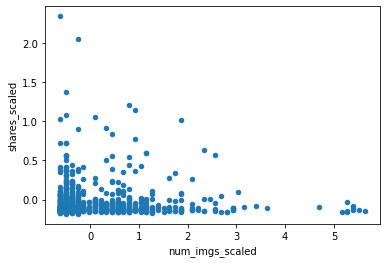

In [75]:
modified_df.plot.scatter('num_imgs_scaled','shares_scaled')
plt.show()

In [73]:
modified_df = modified_df.sort_values(by = 'num_imgs_scaled', ascending = False)
modified_df


,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
455,Iran Enters New Round of Nuclear Talks With U....,Iran entered a third round of nuclear talks wi...,unknown,4.500000e-01,8,4,2014,-0.622023,5.422368,9.282032,-0.052813,1.266128,-0.111209,-0.958403,0.268185,0.696625,-0.107595,0.606349,0.892779,-0.262277,-0.522203,1.407299,-0.139271
524,How to Protect Yourself From the Heartbleed Bug,An encryption flaw called the Heartbleed bug t...,unknown,0.000000e+00,9,4,2014,-0.555218,5.356466,9.164257,-0.052813,1.213974,0.427645,1.499949,0.464394,0.960919,-0.096522,0.691179,1.081659,-0.115197,-0.491403,-0.899934,-0.037494
534,Movie Characters Jumpstart New Careers With Bu...,Your favorite movie characters have a wealth o...,unknown,0.000000e+00,9,4,2014,-1.106340,0.084299,5.631007,-0.298049,0.145090,-0.650064,-0.199220,-0.247608,-0.378998,-0.200575,0.014720,-0.550504,-0.662724,0.178346,-0.899934,-0.148122
905,"Kim Dotcom May Get Seized Cars, Cash and Prope...",It's been a decent week for Kim Dotcom.\n\nAft...,Entertainment,0.000000e+00,16,4,2014,-0.375312,-0.377015,5.513232,-0.298049,0.021233,-1.727774,1.327586,-0.382492,-0.155402,-0.184004,-0.329330,-0.176898,-0.835530,-0.038775,-0.899934,-0.130421
671,Subway Rider Spots Crafty Credit Card Skimmer,An eagle-eyed New York City subway rider has s...,unknown,0.000000e+00,11,4,2014,-0.341505,-0.311113,5.395457,-0.298049,0.147775,-1.727774,0.934666,-0.383881,-0.299523,-0.179121,-0.173527,-0.426913,-0.899750,0.012212,-0.899934,-0.077320
275,Gay Couples May Soon Be Legally Recognized in ...,A federal judge in Cincinnati said Friday he w...,Entertainment,1.250000e-01,4,4,2014,-0.566116,1.995460,5.395457,-0.298049,0.124341,-1.188919,0.831173,-0.083906,0.128577,-0.189337,-0.357640,-0.028786,-0.789631,-0.142834,-0.515395,-0.112721
893,Google Q1 Earnings: What to Expect,When Google reported its fourth quarter earnin...,Entertainment,3.000000e-01,16,4,2014,-0.344883,-0.179309,5.395457,-0.052813,-0.030381,-0.111209,0.770822,-0.324951,-0.086151,-0.196748,-0.057481,-0.270342,-0.951011,-0.045978,1.253484,-0.139271
969,Google Remote Desktop for Android: Control You...,Good news for Android users: You can now acces...,Entertainment,0.000000e+00,17,4,2014,-0.359259,-0.377015,5.277682,-0.052813,0.036084,-1.188919,1.327624,-0.060597,0.235537,-0.193198,-0.439217,-0.813066,-1.287941,0.152094,-0.899934,-0.161308
659,Imogen Heap Takes High-Tech Musical Glove to K...,"In 2011, Grammy Award-winning musician Imogen ...",Entertainment,1.000000e-01,11,4,2014,-0.443860,-0.311113,5.277682,-0.052813,0.031136,-0.650064,0.779298,-0.062729,0.005985,-0.104506,-0.330109,-0.579308,-1.132881,-0.071471,-0.899934,-0.037494
15,New Comedy Central App Is a Bonanza of Full Ep...,No April Foolâ€™s joke: Thereâ€™s a comedy cab...,unknown,0.000000e+00,1,4,2014,-0.406213,-0.508819,5.277682,-0.052813,0.021896,-0.111209,-0.958403,-0.054990,-0.052937,-0.175883,-0.415150,-0.594516,-1.090749,-0.085877,-0.899934,-0.143696


In [74]:
modified_df = modified_df.iloc[2:,:]
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
534,Movie Characters Jumpstart New Careers With Bu...,Your favorite movie characters have a wealth o...,unknown,0.000000e+00,9,4,2014,-1.106340,0.084299,5.631007,-0.298049,0.145090,-0.650064,-0.199220,-0.247608,-0.378998,-0.200575,0.014720,-0.550504,-0.662724,0.178346,-0.899934,-0.148122
905,"Kim Dotcom May Get Seized Cars, Cash and Prope...",It's been a decent week for Kim Dotcom.\n\nAft...,Entertainment,0.000000e+00,16,4,2014,-0.375312,-0.377015,5.513232,-0.298049,0.021233,-1.727774,1.327586,-0.382492,-0.155402,-0.184004,-0.329330,-0.176898,-0.835530,-0.038775,-0.899934,-0.130421
671,Subway Rider Spots Crafty Credit Card Skimmer,An eagle-eyed New York City subway rider has s...,unknown,0.000000e+00,11,4,2014,-0.341505,-0.311113,5.395457,-0.298049,0.147775,-1.727774,0.934666,-0.383881,-0.299523,-0.179121,-0.173527,-0.426913,-0.899750,0.012212,-0.899934,-0.077320
275,Gay Couples May Soon Be Legally Recognized in ...,A federal judge in Cincinnati said Friday he w...,Entertainment,1.250000e-01,4,4,2014,-0.566116,1.995460,5.395457,-0.298049,0.124341,-1.188919,0.831173,-0.083906,0.128577,-0.189337,-0.357640,-0.028786,-0.789631,-0.142834,-0.515395,-0.112721
893,Google Q1 Earnings: What to Expect,When Google reported its fourth quarter earnin...,Entertainment,3.000000e-01,16,4,2014,-0.344883,-0.179309,5.395457,-0.052813,-0.030381,-0.111209,0.770822,-0.324951,-0.086151,-0.196748,-0.057481,-0.270342,-0.951011,-0.045978,1.253484,-0.139271
969,Google Remote Desktop for Android: Control You...,Good news for Android users: You can now acces...,Entertainment,0.000000e+00,17,4,2014,-0.359259,-0.377015,5.277682,-0.052813,0.036084,-1.188919,1.327624,-0.060597,0.235537,-0.193198,-0.439217,-0.813066,-1.287941,0.152094,-0.899934,-0.161308
659,Imogen Heap Takes High-Tech Musical Glove to K...,"In 2011, Grammy Award-winning musician Imogen ...",Entertainment,1.000000e-01,11,4,2014,-0.443860,-0.311113,5.277682,-0.052813,0.031136,-0.650064,0.779298,-0.062729,0.005985,-0.104506,-0.330109,-0.579308,-1.132881,-0.071471,-0.899934,-0.037494
15,New Comedy Central App Is a Bonanza of Full Ep...,No April Foolâ€™s joke: Thereâ€™s a comedy cab...,unknown,0.000000e+00,1,4,2014,-0.406213,-0.508819,5.277682,-0.052813,0.021896,-0.111209,-0.958403,-0.054990,-0.052937,-0.175883,-0.415150,-0.594516,-1.090749,-0.085877,-0.899934,-0.143696
63,Twitter Flies Into Wearables With Helmet and '...,It was only a matter of time before Twitter(Op...,Entertainment,0.000000e+00,1,4,2014,-0.960021,7.069921,5.159907,6.323338,1.000471,-0.650064,0.072759,-0.309858,-0.096343,-0.090242,0.928751,0.386107,0.104018,-0.196854,-0.899934,-0.154848
802,Watch the 'X-Men: Days of Future Past' Opening...,Ellen Page revealed an exclusive sneak peek of...,Social Media,5.000000e-01,14,4,2014,0.577017,1.204635,4.688807,-0.298049,0.502682,0.427645,0.669528,0.335268,0.702491,-0.219886,0.652549,1.843462,1.412223,-0.699141,0.638222,-0.095020


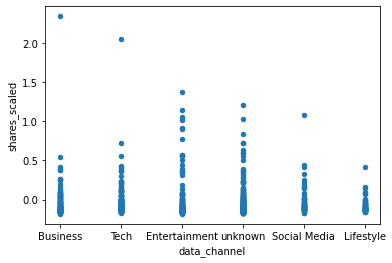

In [72]:
modified_df.plot.scatter('data_channel','shares_scaled')
plt.show()

## outlier for num_videos

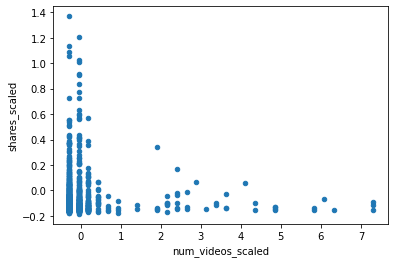

In [83]:
modified_df.plot.scatter('num_videos_scaled','shares_scaled')
plt.show()


In [78]:
modified_df = modified_df.sort_values(by = 'num_videos_scaled', ascending = False)
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
810,The Boston Stories You Must Read Today,In the year since two brothers allegedly set o...,unknown,0.000000e+00,15,4,2014,0.844143,2.720383,-0.493293,12.209015,0.786802,1.505355,2.099267,3.227509,3.427207,-0.140234,1.019667,-0.398595,-0.075874,0.360117,2.022562,-0.103871
239,11 Flavorful Celebrity Chefs on Twitter,It has never been a better time to be a foodie...,unknown,1.000000e-01,4,4,2014,0.700924,2.720383,-0.611068,12.209015,0.767995,-0.650064,2.065115,0.129400,1.359516,-0.028525,0.584436,-0.016411,-0.163458,0.143659,-0.284671,0.719198
541,Flex Your Nerd Muscle to These Pop Culture Wor...,Have you ever wanted a body like Batman? Now y...,unknown,2.888890e-01,9,4,2014,0.694085,1.534145,-0.611068,7.304284,0.485551,-0.650064,2.069434,0.382773,1.824221,-0.172289,0.461929,-0.351326,-0.386120,0.345048,0.706584,-0.090595
37,11 Innovative Lamps that Will Delight and Disturb,"Let there be light, and let that light emanate...",unknown,-1.666700e-01,1,4,2014,0.971612,1.336439,-0.611068,7.304284,0.590583,1.505355,1.024807,0.654715,0.988913,-0.188802,0.232532,-0.666761,-0.467320,1.482871,0.433133,-0.112721
348,"AT&T U-verse Service Suffers Massive, Nationwi...","UPDATE, April 7, 3:15 p.m. ET: An AT&T spokesp...",unknown,0.000000e+00,7,4,2014,1.017993,1.402341,-0.611068,7.304284,0.425834,0.427645,-0.958403,0.893965,0.972837,-0.010069,1.496589,0.740568,0.504402,0.884012,-0.899934,-0.155600
63,Twitter Flies Into Wearables With Helmet and '...,It was only a matter of time before Twitter(Op...,Entertainment,0.000000e+00,1,4,2014,-0.960021,7.069921,5.159907,6.323338,1.000471,-0.650064,0.072759,-0.309858,-0.096343,-0.090242,0.928751,0.386107,0.104018,-0.196854,-0.899934,-0.154848
785,The Rufus Cuff 'Wrist Communicator': A Step Ab...,Although we're still far off from the year 300...,Entertainment,0.000000e+00,14,4,2014,-0.102097,-0.442917,-0.611068,6.078101,-0.259875,-1.188919,0.385660,-0.063747,0.082879,-0.235409,0.030997,-1.442041,0.862015,3.500740,-0.899934,-0.068470
167,BitTorrent and the Man Who Changed the Internet,BitTorrent is often mentioned in the same brea...,Entertainment,-3.343800e-01,3,4,2014,-0.226475,0.545614,-0.375518,5.832865,-0.124932,-0.650064,-0.958403,-0.387854,-0.605319,-0.240033,0.218583,-1.178657,1.206733,3.097394,0.715130,-0.139271
968,Google Releases Android Camera App With Select...,Google has released a standalone version of it...,Entertainment,1.250000e-01,17,4,2014,-0.320829,-0.377015,-0.493293,5.832865,-0.098272,-0.111209,-0.958403,-0.270327,-0.447831,-0.236924,-0.132890,-1.008241,0.783368,2.716603,-0.387214,-0.150777
65,"The USA's 1994 World Cup Jerseys: 'Denim,' Der...",We got our first look on Tuesday at the away j...,Entertainment,0.000000e+00,1,4,2014,1.742965,-0.640623,-0.611068,4.851918,0.116002,-0.650064,1.794505,-0.054990,0.473458,-0.035315,0.616577,-0.874039,0.214073,2.250803,-0.899934,-0.150821


In [79]:
modified_df = modified_df.iloc[2:,:]
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
541,Flex Your Nerd Muscle to These Pop Culture Wor...,Have you ever wanted a body like Batman? Now y...,unknown,2.888890e-01,9,4,2014,0.694085,1.534145,-0.611068,7.304284,0.485551,-0.650064,2.069434,0.382773,1.824221,-0.172289,0.461929,-0.351326,-0.386120,0.345048,0.706584,-0.090595
37,11 Innovative Lamps that Will Delight and Disturb,"Let there be light, and let that light emanate...",unknown,-1.666700e-01,1,4,2014,0.971612,1.336439,-0.611068,7.304284,0.590583,1.505355,1.024807,0.654715,0.988913,-0.188802,0.232532,-0.666761,-0.467320,1.482871,0.433133,-0.112721
348,"AT&T U-verse Service Suffers Massive, Nationwi...","UPDATE, April 7, 3:15 p.m. ET: An AT&T spokesp...",unknown,0.000000e+00,7,4,2014,1.017993,1.402341,-0.611068,7.304284,0.425834,0.427645,-0.958403,0.893965,0.972837,-0.010069,1.496589,0.740568,0.504402,0.884012,-0.899934,-0.155600
63,Twitter Flies Into Wearables With Helmet and '...,It was only a matter of time before Twitter(Op...,Entertainment,0.000000e+00,1,4,2014,-0.960021,7.069921,5.159907,6.323338,1.000471,-0.650064,0.072759,-0.309858,-0.096343,-0.090242,0.928751,0.386107,0.104018,-0.196854,-0.899934,-0.154848
785,The Rufus Cuff 'Wrist Communicator': A Step Ab...,Although we're still far off from the year 300...,Entertainment,0.000000e+00,14,4,2014,-0.102097,-0.442917,-0.611068,6.078101,-0.259875,-1.188919,0.385660,-0.063747,0.082879,-0.235409,0.030997,-1.442041,0.862015,3.500740,-0.899934,-0.068470
167,BitTorrent and the Man Who Changed the Internet,BitTorrent is often mentioned in the same brea...,Entertainment,-3.343800e-01,3,4,2014,-0.226475,0.545614,-0.375518,5.832865,-0.124932,-0.650064,-0.958403,-0.387854,-0.605319,-0.240033,0.218583,-1.178657,1.206733,3.097394,0.715130,-0.139271
968,Google Releases Android Camera App With Select...,Google has released a standalone version of it...,Entertainment,1.250000e-01,17,4,2014,-0.320829,-0.377015,-0.493293,5.832865,-0.098272,-0.111209,-0.958403,-0.270327,-0.447831,-0.236924,-0.132890,-1.008241,0.783368,2.716603,-0.387214,-0.150777
65,"The USA's 1994 World Cup Jerseys: 'Denim,' Der...",We got our first look on Tuesday at the away j...,Entertainment,0.000000e+00,1,4,2014,1.742965,-0.640623,-0.611068,4.851918,0.116002,-0.650064,1.794505,-0.054990,0.473458,-0.035315,0.616577,-0.874039,0.214073,2.250803,-0.899934,-0.150821
351,Breakdancing Cop Makes You Want to Put Your Ha...,Think of the respect the NYPD could earn with ...,Entertainment,5.000000e-01,7,4,2014,0.555388,0.809222,-0.611068,4.851918,0.177645,-0.111209,-0.958403,-0.327933,-0.548684,0.239574,0.313907,0.628767,-0.530965,0.013065,2.176377,-0.147015
243,How to Cope With Information Overload,Information overload has become an everyday ex...,unknown,-1.277800e-01,4,4,2014,1.226905,-0.574721,-0.611068,4.851918,-0.105077,-1.188919,-0.147337,-0.058540,0.612201,-0.001327,1.440234,-1.406238,-0.343541,2.976561,0.159683,-0.130421


In [81]:
modified_df = modified_df.sort_values(by = 'shares_scaled', ascending = False)
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
383,Space Nerds Rejoice: NASA Tweets Even More 'Co...,On the latest episode of Cosmos: A Space-Time ...,Business,-2.916700e-01,7,4,2014,0.962297,-0.508819,-0.611068,0.192424,-0.209212,-0.111209,-0.958403,0.082282,-0.067679,-0.072237,-2.325688,-2.478598,-1.858832,1.317496,1.150941,2.343210
627,How Brands Are Using Twitter's Redesigned Prof...,"Visa's on, but MasterCard isn't. Microsoft has...",Tech,0.000000e+00,10,4,2014,0.131711,-0.442917,-0.257743,-0.052813,-0.423563,-1.188919,-0.958403,-0.267332,-0.355892,0.165750,0.840356,-1.018301,-0.166777,0.211136,-0.899934,2.055578
368,Watch HBO's 'Silicon Valley' Premiere on YouTu...,HBO just posted the first 30-minute episode of...,Entertainment,0.000000e+00,7,4,2014,-0.869424,3.313502,-0.493293,-0.298049,-0.145904,-1.188919,1.803566,0.610497,1.418527,-0.043096,0.896619,0.200700,-0.201951,-0.249736,-0.899934,1.369688
163,Apple Reveals Worldwide Developers Conference ...,Apple will hold its annual Worldwide Developer...,unknown,2.250000e-01,3,4,2014,-0.172717,-0.574721,0.802232,-0.052813,-0.261744,0.966500,0.882526,0.275468,1.356724,0.959363,1.422115,-1.841066,-0.558990,1.501257,1.253484,1.205959
430,Scientists Raise Odds of El NiÃ±o This Year to...,There is a greater than 70% chance that an El ...,Entertainment,5.000000e-02,8,4,2014,-0.007272,-0.311113,0.920007,-0.298049,-0.501487,-0.650064,1.806933,0.101789,1.164609,0.234848,0.764828,0.747404,-0.382800,0.094284,0.484406,1.139582
789,UConn's Shabazz Napier Is the 2014 National Ch...,Leading your team to the March Madness title t...,Social Media,1.000000e+00,14,4,2014,-0.017083,3.774816,-0.493293,-0.298049,0.125250,-1.188919,-0.958403,0.256560,0.334794,-0.206287,0.974649,0.295659,0.080782,-0.246893,2.176377,1.086481
989,"It's Like RunKeeper, But for People Who Don't Run",RunKeeper is targeting non-athletes with its n...,Entertainment,0.000000e+00,17,4,2014,-0.758108,2.127264,0.095582,-0.298049,-0.304491,1.505355,-0.958403,0.252631,1.120640,-0.262627,0.371343,-0.003983,0.028563,-0.311906,-0.899934,1.059931
895,Extra-Bright LED Belt Could Save Lives,"More than 5,000 cyclists and pedestrians are k...",unknown,-1.000000e-01,16,4,2014,-0.289549,9.112885,-0.611068,-0.052813,0.789860,-0.111209,2.102080,0.162568,1.426123,0.634924,0.529960,-0.750773,-0.300196,1.185290,0.176775,1.024530
282,10 Cocktails for Your Spring Buzz,After what has felt like the longest Winter ev...,Entertainment,5.000000e-01,4,4,2014,-0.932119,0.941027,1.862207,-0.052813,0.266375,0.966500,-0.958403,-0.274257,-0.717125,-0.198516,0.257717,-0.220878,-0.114176,0.838427,0.638222,1.011255
322,If Social Networks Were 'Game of Thrones' Houses,The state of social networks today has a lot i...,Entertainment,0.000000e+00,6,4,2014,0.120973,-0.508819,0.331132,-0.052813,0.176948,-1.188919,-0.958403,-0.148783,-0.067581,-0.262627,0.223505,0.239542,-0.762118,-0.752118,-0.899934,0.918327


In [82]:
modified_df = modified_df.iloc[2:,:]
modified_df

,title,text,data_channel,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
368,Watch HBO's 'Silicon Valley' Premiere on YouTu...,HBO just posted the first 30-minute episode of...,Entertainment,0.000000e+00,7,4,2014,-0.869424,3.313502,-0.493293,-0.298049,-0.145904,-1.188919,1.803566,0.610497,1.418527,-0.043096,0.896619,0.200700,-0.201951,-0.249736,-0.899934,1.369688
163,Apple Reveals Worldwide Developers Conference ...,Apple will hold its annual Worldwide Developer...,unknown,2.250000e-01,3,4,2014,-0.172717,-0.574721,0.802232,-0.052813,-0.261744,0.966500,0.882526,0.275468,1.356724,0.959363,1.422115,-1.841066,-0.558990,1.501257,1.253484,1.205959
430,Scientists Raise Odds of El NiÃ±o This Year to...,There is a greater than 70% chance that an El ...,Entertainment,5.000000e-02,8,4,2014,-0.007272,-0.311113,0.920007,-0.298049,-0.501487,-0.650064,1.806933,0.101789,1.164609,0.234848,0.764828,0.747404,-0.382800,0.094284,0.484406,1.139582
789,UConn's Shabazz Napier Is the 2014 National Ch...,Leading your team to the March Madness title t...,Social Media,1.000000e+00,14,4,2014,-0.017083,3.774816,-0.493293,-0.298049,0.125250,-1.188919,-0.958403,0.256560,0.334794,-0.206287,0.974649,0.295659,0.080782,-0.246893,2.176377,1.086481
989,"It's Like RunKeeper, But for People Who Don't Run",RunKeeper is targeting non-athletes with its n...,Entertainment,0.000000e+00,17,4,2014,-0.758108,2.127264,0.095582,-0.298049,-0.304491,1.505355,-0.958403,0.252631,1.120640,-0.262627,0.371343,-0.003983,0.028563,-0.311906,-0.899934,1.059931
895,Extra-Bright LED Belt Could Save Lives,"More than 5,000 cyclists and pedestrians are k...",unknown,-1.000000e-01,16,4,2014,-0.289549,9.112885,-0.611068,-0.052813,0.789860,-0.111209,2.102080,0.162568,1.426123,0.634924,0.529960,-0.750773,-0.300196,1.185290,0.176775,1.024530
282,10 Cocktails for Your Spring Buzz,After what has felt like the longest Winter ev...,Entertainment,5.000000e-01,4,4,2014,-0.932119,0.941027,1.862207,-0.052813,0.266375,0.966500,-0.958403,-0.274257,-0.717125,-0.198516,0.257717,-0.220878,-0.114176,0.838427,0.638222,1.011255
322,If Social Networks Were 'Game of Thrones' Houses,The state of social networks today has a lot i...,Entertainment,0.000000e+00,6,4,2014,0.120973,-0.508819,0.331132,-0.052813,0.176948,-1.188919,-0.958403,-0.148783,-0.067581,-0.262627,0.223505,0.239542,-0.762118,-0.752118,-0.899934,0.918327
30,WTF Is HFT? What You Should Know About High-Fr...,If you've scratched your head this week about ...,Entertainment,-4.000000e-01,1,4,2014,-0.626663,3.313502,-0.257743,-0.052813,-0.095873,-1.727774,1.794505,0.692693,1.491085,-0.211591,1.103819,0.312143,-0.364798,-0.146435,1.253484,0.905052
288,YouTube Stays Blocked in Turkey as Court Rever...,The same Turkish court that ruled to lift the ...,unknown,5.000000e-01,4,4,2014,-0.188795,-0.179309,0.448907,-0.052813,0.646079,0.427645,-0.504714,-0.083906,0.023048,-0.262627,-1.045208,-0.498584,-0.726625,0.960019,0.638222,0.834251


## Multivariate Analysis

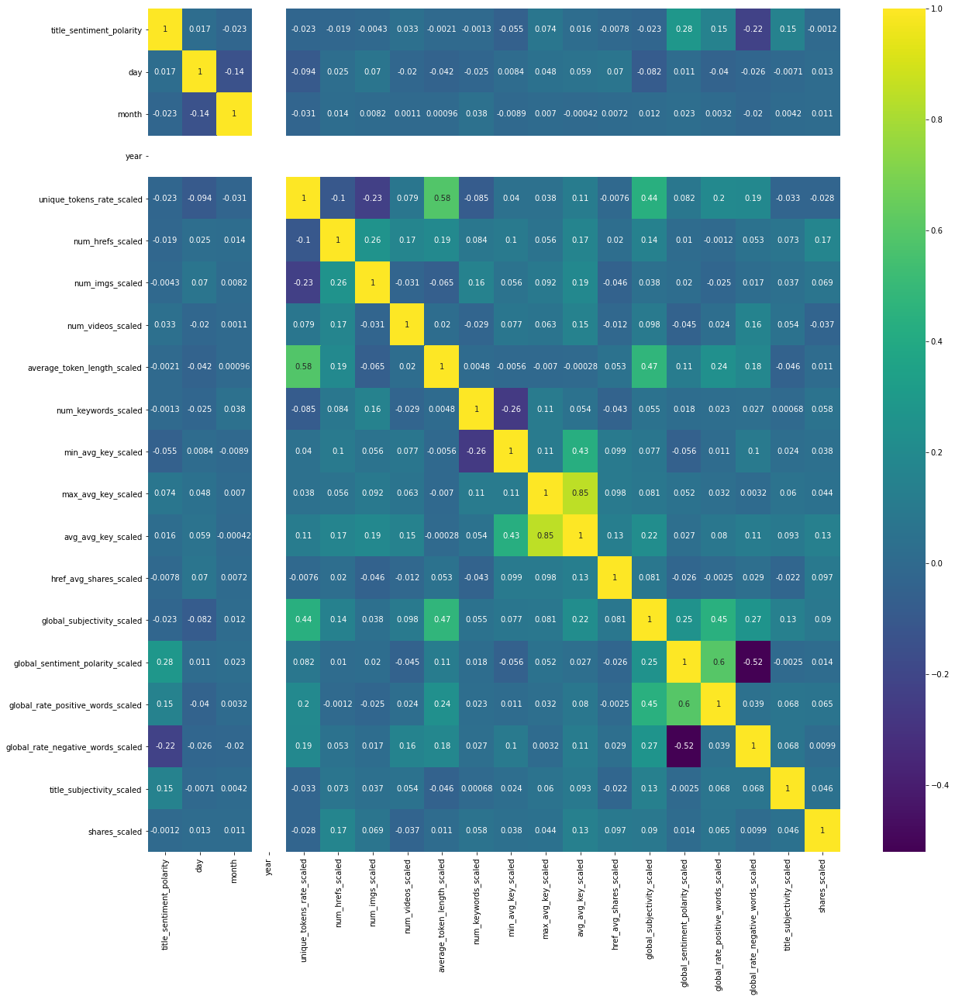

In [85]:
plt.figure(figsize=(20,20))
df_corr = modified_df.corr()
sns.heatmap(df_corr,annot = True,cmap = 'viridis')
plt.show()

In [98]:
taken =["unique_tokens_rate_scaled","num_hrefs_scaled","num_imgs_scaled","num_videos_scaled","max_avg_key_scaled","avg_avg_key_scaled","href_avg_shares_scaled"]#modified_df.columns
print("\nDistribution (raw):")
display(modified_df[taken].describe())        

# Outlier treatment
def clip_outliers(df,col):
    q_l = modified_df[col].min()
    q_h = modified_df[col].quantile(0.95)
    modified_df[col] = modified_df[col].clip(lower = q_l, upper = q_h)
    return modified_df

for col in taken:
    modified_df = clip_outliers(modified_df,col)
    

print("\nDistribution (after outlier treatment):")
display(modified_df[taken].describe())  


Distribution (raw):


,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled
count,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000
mean,-0.024847,-0.044530,-0.022469,-0.002094,-0.005825,0.000900
std,0.924449,0.829793,0.845234,1.003031,0.999139,1.008694
min,-0.772428,-0.611068,-0.298049,-0.388420,-1.362956,-0.262627
25%,-0.508819,-0.493293,-0.298049,-0.382492,-0.573683,-0.237371
50%,-0.245211,-0.375518,-0.298049,-0.245239,-0.243931,-0.210173
75%,0.084299,0.213357,-0.052813,0.011104,0.303708,-0.123073
max,9.903710,5.277682,7.304284,12.847631,9.710529,12.629462



Distribution (after outlier treatment):


,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled
count,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000
mean,-0.100975,-0.091054,-0.144092,-0.124718,-0.077739,-0.126870
std,0.516968,0.658188,0.257076,0.314715,0.706032,0.215465
min,-0.772428,-0.611068,-0.298049,-0.388420,-1.362956,-0.262627
25%,-0.508819,-0.493293,-0.298049,-0.382492,-0.573683,-0.237371
50%,-0.245211,-0.375518,-0.298049,-0.245239,-0.243931,-0.210173
75%,0.084299,0.213357,-0.052813,0.011104,0.303708,-0.123073
max,1.270537,1.714988,0.682897,0.716177,1.543814,0.622296


In [88]:
modified_df.columns

Index(['title', 'text', 'data_channel', 'title_sentiment_polarity', 'day',
       'month', 'year', 'unique_tokens_rate_scaled', 'num_hrefs_scaled',
       'num_imgs_scaled', 'num_videos_scaled', 'average_token_length_scaled',
       'num_keywords_scaled', 'min_avg_key_scaled', 'max_avg_key_scaled',
       'avg_avg_key_scaled', 'href_avg_shares_scaled',
       'global_subjectivity_scaled', 'global_sentiment_polarity_scaled',
       'global_rate_positive_words_scaled',
       'global_rate_negative_words_scaled', 'title_subjectivity_scaled',
       'shares_scaled'],
      dtype='object')

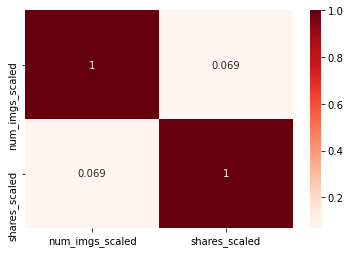

In [90]:
x = modified_df[['num_imgs_scaled','shares_scaled']].corr()
sns.heatmap(x,annot = True,cmap = 'Reds')
plt.show()

In [102]:
modified_df.describe()

,title_sentiment_polarity,day,month,year,unique_tokens_rate_scaled,num_hrefs_scaled,num_imgs_scaled,num_videos_scaled,average_token_length_scaled,num_keywords_scaled,min_avg_key_scaled,max_avg_key_scaled,avg_avg_key_scaled,href_avg_shares_scaled,global_subjectivity_scaled,global_sentiment_polarity_scaled,global_rate_positive_words_scaled,global_rate_negative_words_scaled,title_subjectivity_scaled,shares_scaled
count,986.000000,986.000000,986.000000,986.0,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000
mean,0.056885,8.758621,3.998986,2014.0,0.001422,-0.100975,-0.091054,-0.144092,-0.004010,0.005196,-0.001952,-0.124718,-0.077739,-0.126870,-0.003997,0.005703,0.009181,-0.001020,-0.000013,-0.056189
std,0.267826,5.156293,0.031846,0.0,1.000997,0.516968,0.658188,0.257076,1.006468,0.999808,0.997813,0.314715,0.706032,0.215465,1.002468,1.002966,1.004414,1.005861,1.000023,0.177043
min,-1.000000,1.000000,3.000000,2014.0,-4.437561,-0.772428,-0.611068,-0.298049,-6.563613,-2.805483,-0.958403,-0.388420,-1.362956,-0.262627,-4.094170,-4.393572,-2.436554,-1.684288,-0.899934,-0.185381
25%,0.000000,4.000000,4.000000,2014.0,-0.503786,-0.508819,-0.493293,-0.298049,-0.163010,-0.650064,-0.958403,-0.382492,-0.573683,-0.237371,-0.474836,-0.587356,-0.585370,-0.629816,-0.899934,-0.143696
50%,0.000000,9.000000,4.000000,2014.0,0.052770,-0.245211,-0.375518,-0.298049,0.116568,-0.111209,-0.124438,-0.245239,-0.243931,-0.210173,0.082279,-0.031214,-0.037795,-0.145772,-0.284671,-0.117146
75%,0.150000,14.000000,4.000000,2014.0,0.582074,0.084299,0.213357,-0.052813,0.357698,0.966500,0.831918,0.011104,0.303708,-0.123073,0.563448,0.626296,0.583160,0.458442,0.638222,-0.050769
max,1.000000,31.000000,4.000000,2014.0,2.872252,1.270537,1.714988,0.682897,3.727761,1.505355,2.102080,0.716177,1.543814,0.622296,3.925098,4.147477,5.275236,8.079991,2.176377,1.369688


### Feature Engineering